In [43]:
import pandas as pd
import numpy as np

# plotting
import matplotlib.pyplot as plt
import seaborn as sns

Construct basic random forest following https://www.kaggle.com/code/prashant111/random-forest-classifier-tutorial/notebook

In [44]:
pred2004 = pd.read_csv('pred2004.csv')
pred2004.keys()

Index(['Unnamed: 0', 'Order', 'Family', 'Species Name',
       '1980 GAA2 Red List Category', '2004 GAA2 Red List Category',
       '1980-2004 Genuine Change?', '1980-2004 Primary Driver',
       'Grouped 1980-2004 Primary Driver',
       '1980-2004 Genuine downlisting due to conservation',
       '2022 Red List Criteria', 'Afrotropical', 'Australasian/Oceanian',
       'Indomalayan', 'Nearctic', 'Neotropical', 'Palearctic', 'Egg Laying',
       'Free Living Larval Stage', 'Live Birth ', 'Water Breeding', 'N_realm',
       '1980 RL num', '2004 RL num', 'higher risk', 'urbanareas_2004',
       'cropland_2004', 'rangeland_2004', 'managed_pasture_2004',
       'urbanareas_2004_change', 'cropland_2004_change',
       'rangeland_2004_change', 'managed_pasture_2004_change', 'area_2004',
       'MAT_nichefrac_2004', 'MAT_2004', 'MAT_change_2004',
       'MTWM_nichefrac_2004', 'MTWM_2004', 'MTWM_change_2004',
       'MTCM_nichefrac_2004', 'MTCM_2004', 'MTCM_change_2004',
       'AP_nichefrac_2

In [45]:
# Declare feature vector and target variable
x = pred2004.drop(['Unnamed: 0', 'Order', 'Family', 'Species Name', 
       '1980 GAA2 Red List Category', '2004 GAA2 Red List Category',
       '2022 Red List Criteria', '1980-2004 Genuine Change?',
       '1980-2004 Primary Driver', 'Grouped 1980-2004 Primary Driver',
       '1980-2004 Genuine downlisting due to conservation', '1980 RL num', '2004 RL num'], axis=1)



# drop nan values
x = x.dropna()

# target variable
y = x['higher risk']
# feature vector
X = x.drop(['higher risk'], axis=1)

In [46]:
# split data into training and testing sets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [47]:
# check the shape of X_train and X_test

X_train.shape, X_test.shape

((4771, 35), (2046, 35))

In [48]:
# calculate trueskill score
from sklearn.metrics import confusion_matrix

# calculate TSS
def tss(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()
    sensiticity = tp / (tp + fn)
    specitivity = tn / (fp + tn)
    tss = sensiticity + specitivity - 1

    print('Sensiticity (correctly positive): {0:0.4f}'. format(sensiticity))
    print('Specitivity (correctly negative): {0:0.4f}'. format(specitivity))
    print('True Skill Score: {0:0.4f}'. format(tss))

In [34]:
from collections import Counter
from sklearn.datasets import make_classification
from imbens.sampler._over_sampling import SVMSMOTE 

In [10]:
# upsampling using SMOTE
from imbens.sampler._over_sampling import SMOTE 
from imbens.sampler._over_sampling import ADASYN
from imbens.sampler._over_sampling import SVMSMOTE
from imbens.sampler._over_sampling import BorderlineSMOTE 
from imbens.sampler._over_sampling import RandomOverSampler 

sm = SVMSMOTE()
X_res, y_res = sm.fit_resample(X_train, y_train)

NameError: name 'X_train' is not defined

In [49]:
# downsampling
npos = y_train.sum()
ntot = y_train.shape[0]

# get indices of negative samples
neg_indices = y_train[y_train == 0].index

# select (ntot - 2 * npos) random sample from negative samples to kick out
# np.random.seed(42)
neg_indices_to_kickout = np.random.choice(neg_indices, ntot - 2 * npos, replace=False)

# resample X_train and y_train based on indices
X_res = X_train.drop(neg_indices_to_kickout)
y_res = y_train.drop(neg_indices_to_kickout)

In [50]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=100, max_features= 14, min_samples_leaf=2,
                             min_impurity_decrease= 0.0002, random_state=42)

# Fit the model
rfc.fit(X_res, y_res)

# Predict the Test set results
y_pred = rfc.predict(X_test)


# Check the performance of the model
print('Model performance on testing set:')
tss(y_test, y_pred)

print()
yy_pred = rfc.predict(X_train)
print('Model performance on training set:')
tss(y_train, yy_pred)

Model performance on testing set:
Sensiticity (correctly positive): 0.7604
Specitivity (correctly negative): 0.7548
True Skill Score: 0.5153

Model performance on training set:
Sensiticity (correctly positive): 1.0000
Specitivity (correctly negative): 0.7996
True Skill Score: 0.7996


In [51]:
# view the feature scores
importances = rfc.feature_importances_
std = np.std([tree.feature_importances_ for tree in rfc.estimators_], axis=0)
feature_scores = pd.Series(importances, index=X_train.columns).sort_values(ascending=False)
# feature_scores

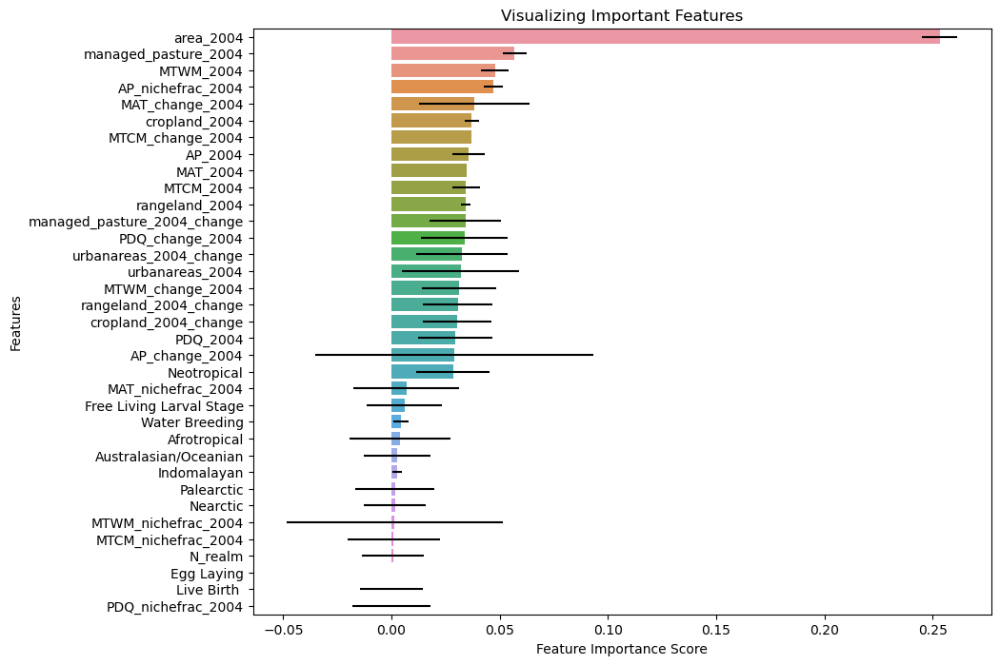

In [52]:
# Creating a seaborn bar plot
plt.figure(figsize=(10, 8))
sns.barplot(x=feature_scores, xerr=std, y=feature_scores.index)

# Add labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')

# Add title to the graph
plt.title("Visualizing Important Features")

# Visualize the graph
plt.show()

Calculate feature importance based on full model permutation importance:
https://scikit-learn.org/stable/modules/permutation_importance.html#permutation-importance

Text(0.5, 1.0, 'Feature importances using permutation on full model')

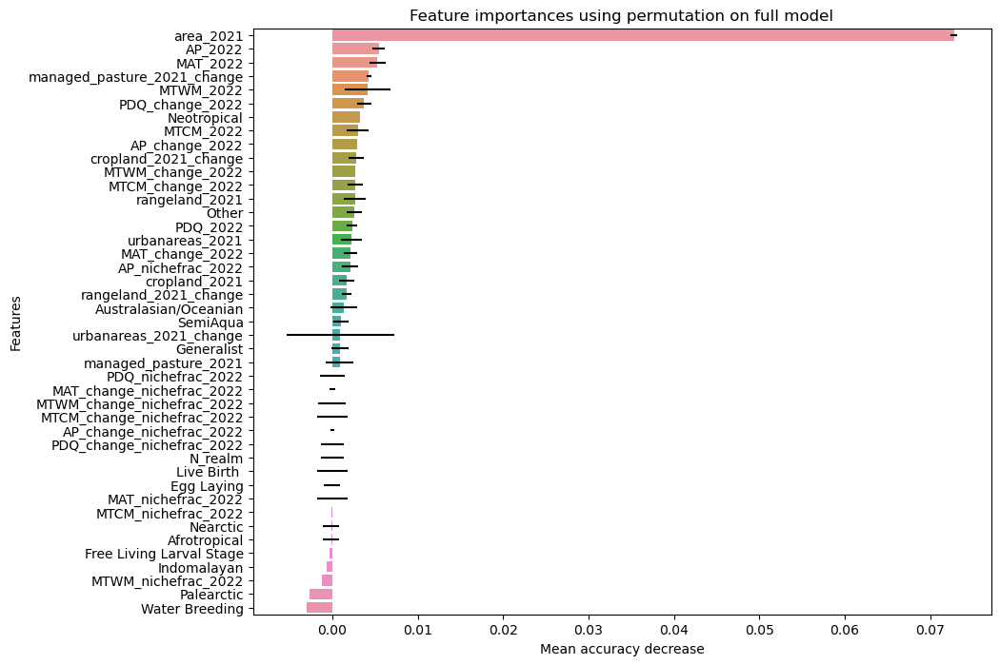

In [404]:
from sklearn.inspection import permutation_importance

result = permutation_importance(
    rfc, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)

forest_importances = pd.Series(result.importances_mean, index=X_train.columns).sort_values(ascending=False)

# plot 
plt.figure(figsize=(10, 8))
sns.barplot(x=forest_importances, xerr=result.importances_std,  y=forest_importances.index)

# Add labels to the graph
plt.xlabel("Mean accuracy decrease")
plt.ylabel('Features')

# Add title to the graph
plt.title("Feature importances using permutation on full model")


In [12]:
import sys
print(sys.executable)

c:\Users\Claus\.conda\envs\ml_env\python.exe


In [24]:
# Tree Visualisation
from sklearn import tree
fn=X_train.columns
cn=X_train.columns
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (16,16), dpi=1600)
tree.plot_tree(rfc.estimators_[0],
               filled = True)

[Text(0.2676797184350252, 0.9772727272727273, 'x[32] <= 1.0\ngini = 0.214\nsamples = 2165\nvalue = [3008, 418]'),
 Text(0.03533717302615791, 0.9318181818181818, 'x[15] <= 0.0\ngini = 0.07\nsamples = 811\nvalue = [1228, 46]'),
 Text(0.007679385649148068, 0.8863636363636364, 'x[4] <= 0.5\ngini = 0.48\nsamples = 7\nvalue = [4, 6]'),
 Text(0.003839692824574034, 0.8409090909090909, 'gini = 0.0\nsamples = 3\nvalue = [3, 0]'),
 Text(0.011519078473722102, 0.8409090909090909, 'x[25] <= 0.672\ngini = 0.245\nsamples = 4\nvalue = [1, 6]'),
 Text(0.007679385649148068, 0.7954545454545454, 'gini = 0.0\nsamples = 3\nvalue = [0, 6]'),
 Text(0.015358771298296136, 0.7954545454545454, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(0.06299496040316775, 0.8863636363636364, 'x[41] <= -0.1\ngini = 0.061\nsamples = 804\nvalue = [1224, 40]'),
 Text(0.02687784977201824, 0.8409090909090909, 'x[42] <= 0.043\ngini = 0.404\nsamples = 40\nvalue = [41, 16]'),
 Text(0.023038156947444204, 0.7954545454545454, 'x[15] <

In [21]:
X_train.columns

Index(['Afrotropical', 'Australasian/Oceanian', 'Indomalayan', 'Nearctic',
       'Neotropical', 'Palearctic', 'Egg Laying', 'Free Living Larval Stage',
       'Live Birth ', 'Water Breeding', 'N_realm', 'SemiAqua', 'Generalist',
       'Other', 'urbanareas_2021', 'cropland_2021', 'rangeland_2021',
       'managed_pasture_2021', 'urbanareas_2021_change',
       'cropland_2021_change', 'rangeland_2021_change',
       'managed_pasture_2021_change', 'area_2021', 'MAT_nichefrac_2022',
       'MAT_column_2022', 'MAT_change_column_2022', 'MTWM_nichefrac_2022',
       'MTWM_column_2022', 'MTWM_change_column_2022', 'MTCM_nichefrac_2022',
       'MTCM_column_2022', 'MTCM_change_column_2022', 'AP_nichefrac_2022',
       'AP_column_2022', 'AP_change_column_2022', 'PDQ_nichefrac_2022',
       'PDQ_column_2022', 'PDQ_change_column_2022',
       'MAT_change_nichefrac_2022', 'MTWM_change_nichefrac_2022',
       'MTCM_change_nichefrac_2022', 'AP_change_nichefrac_2022',
       'PDQ_change_nichefrac_202